# Final Project - Adverse External Influence Recognition for Residential Properties
## Author - Ryan Lucero

In [1]:
# Importing important packages
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from keras.layers import Dropout, Dense, Flatten, BatchNormalization, GlobalAveragePooling2D
from keras.models import Sequential
from keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
%matplotlib inline

2024-08-20 22:35:59.469801: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-20 22:35:59.469908: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-20 22:35:59.623541: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Data Input - No Augmentation

In [2]:
import os
print(os.getcwd())

# change the directory to match your dateset location
data_dir = '/kaggle/input/subjects/Subjects' ###kaggle - needed the extra GPUs

Name = os.listdir(data_dir)
print(Name)
print(len(Name))

N=list(range(len(Name)))
normal_mapping=dict(zip(Name,N)) 
reverse_mapping=dict(zip(N,Name))

/kaggle/working
['Neutral', 'Adverse']
2


In [3]:
preprocess_input = tf.keras.applications.resnet.preprocess_input

# Rescaling the input image. No augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
        validation_split=0.2,
        preprocessing_function=preprocess_input,
        fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale = 1./255,validation_split=0.2)

train_batches = train_datagen.flow_from_directory(
    data_dir,
    target_size=(255,255),
    class_mode='binary',
  batch_size=5,subset = "training")

validation_batches = validation_datagen.flow_from_directory(
    data_dir,
    target_size=(255,255),
    class_mode='binary',
  batch_size=5,subset = "validation")

Found 400 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


In [5]:
validation_batches.class_indices.keys()

dict_keys(['Adverse', 'Neutral'])

In [6]:
unique_values, counts = np.unique(validation_batches.labels, return_counts=True)

print(unique_values)
print(counts) 

[0 1]
[50 50]


# Basic Model

In [4]:
model = tf.keras.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape = (255, 255, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(3))
model.add(layers.Dense(1, activation="sigmoid"))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [8]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 253, 253, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 126, 126, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 124, 124, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 230400)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │    14,745,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             4 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,802,183 (56.47 MB)

 Trainable params: 14,802,183 (56.47 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

In [6]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="model.h5.keras",
        save_best_only=True,
        monitor="val_loss")
]

history = model.fit(
    train_batches,
    epochs=30,
    validation_data=validation_batches,
    callbacks=callbacks
)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 3/80 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.3000 - loss: 3.4710

I0000 00:00:1724193427.166665     125 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1724193427.187768     125 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


79/80 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.4532 - loss: 1.5119

W0000 00:00:1724193433.131180     125 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


80/80 ━━━━━━━━━━━━━━━━━━━━ 15s 97ms/step - accuracy: 0.4534 - loss: 1.4992 - val_accuracy: 0.5400 - val_loss: 0.6909
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.5502 - loss: 0.7683 - val_accuracy: 0.5000 - val_loss: 0.6983
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step - accuracy: 0.5549 - loss: 0.7480 - val_accuracy: 0.5000 - val_loss: 1.0372
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.6083 - loss: 0.6588 - val_accuracy: 0.5300 - val_loss: 0.8390
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7553 - loss: 0.5400 - val_accuracy: 0.5100 - val_loss: 3.2338
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.8872 - loss: 0.2875 - val_accuracy: 0.5100 - val_loss: 3.8064
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - accuracy: 0.9804 - loss: 0.0665 - val_accuracy: 0.5200 - val_loss: 6.7395
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.9954 - loss: 0.0332 - val_accuracy: 0.5100 - val_loss: 1

## Basic Model - Plots

In [7]:
def generate_plots(model_history):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    ax1 = axes[0]
    ax2 = axes[1]

    ax1.plot(model_history.history['accuracy'], label='Training Accuracy')
    ax1.plot(model_history.history['val_accuracy'], label='Validation Accuracy')
    ax1.set_title('Training and Validation Accuracy')
    ax1.set_xlabel('Epoch')
    ax1.set_xticks(range(0,31,5))
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True)

    ax2.plot(model_history.history['loss'], label='Training Loss')
    ax2.plot(model_history.history['val_loss'], label='Validation Loss')
    ax2.set_title('Training and Validation Loss')
    ax2.set_xlabel('Epoch')
    ax2.set_xticks(range(0,31,5))
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True)

    plt.show()

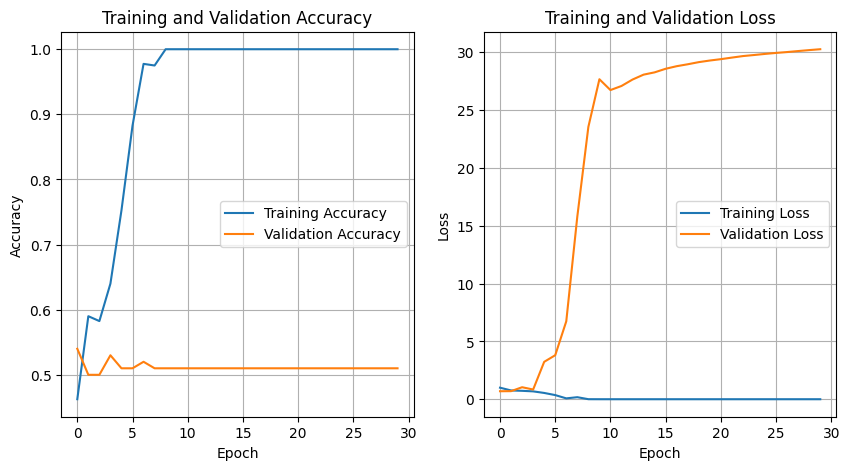

In [8]:
generate_plots(history)

# Improved Model

In [9]:
model_2 = tf.keras.Sequential()
model_2.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape = (255, 255, 3)))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(64, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(128, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(256, (3, 3), activation='relu'))
model_2.add(layers.MaxPooling2D((2, 2)))
model_2.add(layers.Conv2D(256, (3, 3), activation='relu'))
model_2.add(layers.Flatten())
model_2.add(layers.Dropout(.5))
model_2.add(layers.Dense(64, activation='relu'))
model_2.add(layers.Dense(3))
model_2.add(layers.Dense(1, activation="sigmoid")) 

In [14]:
model_2.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 253, 253, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 126, 126, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 124, 124, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 12, 12, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │     2,359,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │           195 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │             4 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,338,055 (12.73 MB)

 Trainable params: 3,338,055 (12.73 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
model_2.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, mode='max')

model_checkpoint = ModelCheckpoint(filepath='model_2.h5.keras',
                                     save_best_only=True,
                                     monitor='val_accuracy',
                                     mode='max')

#callbacks = [early_stopping, model_checkpoint]
callbacks = [model_checkpoint]

history_2 = model_2.fit(
    train_batches,
    epochs=30,
    validation_data=validation_batches,
    callbacks=callbacks
)

Epoch 1/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 55ms/step - accuracy: 0.5415 - loss: 0.8024 - val_accuracy: 0.5000 - val_loss: 0.6927
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.4911 - loss: 0.6825 - val_accuracy: 0.5000 - val_loss: 1.0403
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.6209 - loss: 0.6876 - val_accuracy: 0.5000 - val_loss: 0.6972
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.6019 - loss: 0.6900 - val_accuracy: 0.5000 - val_loss: 0.7761
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.6539 - loss: 0.6646 - val_accuracy: 0.5000 - val_loss: 1.7387
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 46ms/step - accuracy: 0.6463 - loss: 0.6875 - val_accuracy: 0.5000 - val_loss: 1.7072
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - accuracy: 0.6935 - loss: 0.5983 - val_accuracy: 0.5000 - val_loss: 1.2178
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.6191 - loss: 0.6398 - val_accuracy: 0.5000 - 

## Improved Model - Plots

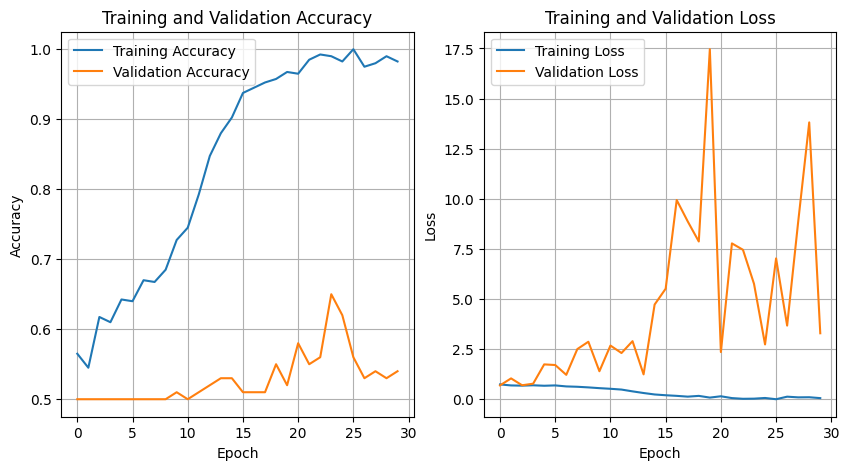

In [12]:
generate_plots(history_2)

## Improved Model - Sample Batch Predictions

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step


/tmp/ipykernel_34/1490707011.py:15: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f'Predicted: {class_names[int(pred_labels[label])]} // Actual: {class_names[label]}')


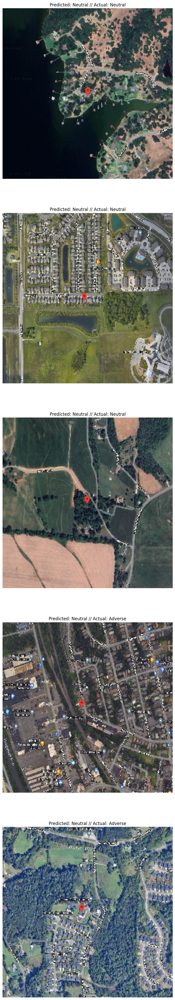

In [13]:
x, y = validation_batches[0]

class_names = ('Adverse', 'Neutral')

preds = model_2.predict(validation_batches)
pred_labels = np.where(preds < .5, 0, 1)

plt.figure(figsize=(10, 50))

for i in range(0,5):
    image = x[i]
    label = int(y[i])
    plt.subplot(5, 1, i+1)
    plt.imshow(image)
    plt.title(f'Predicted: {class_names[int(pred_labels[label])]} // Actual: {class_names[label]}')
    plt.axis('off')

plt.show()

# Data Augmentation

In [81]:
####Augmenting####

# Rescaling the input image as well as Data Augmentation
train_datagen = ImageDataGenerator(rescale = 1./255,
        validation_split=0.2,
        rotation_range=30,
        width_shift_range=0.2,
        preprocessing_function=preprocess_input,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale = 1./255,validation_split=0.2)

train_batches = train_datagen.flow_from_directory(
    data_dir,
    target_size=(255,255),
    class_mode='binary',
  batch_size=5,subset = "training")

validation_batches = validation_datagen.flow_from_directory(
    data_dir,
    target_size=(255,255),
    class_mode='binary',
  batch_size=5,subset = "validation")

Found 400 images belonging to 2 classes.
Found 100 images belonging to 2 classes.


# Improved Model with Augmentation

In [19]:
model_2.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, mode='max')

model_checkpoint = ModelCheckpoint(filepath='model_2_augmentation.h5.keras',
                                     save_best_only=True,
                                     monitor='val_accuracy',
                                     mode='max')

#callbacks = [early_stopping, model_checkpoint]
callbacks = [model_checkpoint]

history_2_with_augmentation = model_2.fit(
    train_batches,
    epochs=30,
    validation_data=validation_batches,
    callbacks=callbacks
)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


80/80 ━━━━━━━━━━━━━━━━━━━━ 14s 121ms/step - accuracy: 0.5370 - loss: 1.7180 - val_accuracy: 0.5000 - val_loss: 0.7016
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.4415 - loss: 0.7137 - val_accuracy: 0.5000 - val_loss: 1.0637
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - accuracy: 0.5876 - loss: 0.7002 - val_accuracy: 0.5000 - val_loss: 1.4598
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - accuracy: 0.6208 - loss: 0.7798 - val_accuracy: 0.5000 - val_loss: 1.2583
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.5957 - loss: 0.6771 - val_accuracy: 0.5000 - val_loss: 0.7853
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 112ms/step - accuracy: 0.6108 - loss: 0.6706 - val_accuracy: 0.5000 - val_loss: 0.7979
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - accuracy: 0.7001 - loss: 0.6276 - val_accuracy: 0.5100 - val_loss: 0.6803
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - accuracy: 0.6293 - loss: 0.6408 - val_accuracy: 0.500

## Improved Model with Data Augmentation - Plots

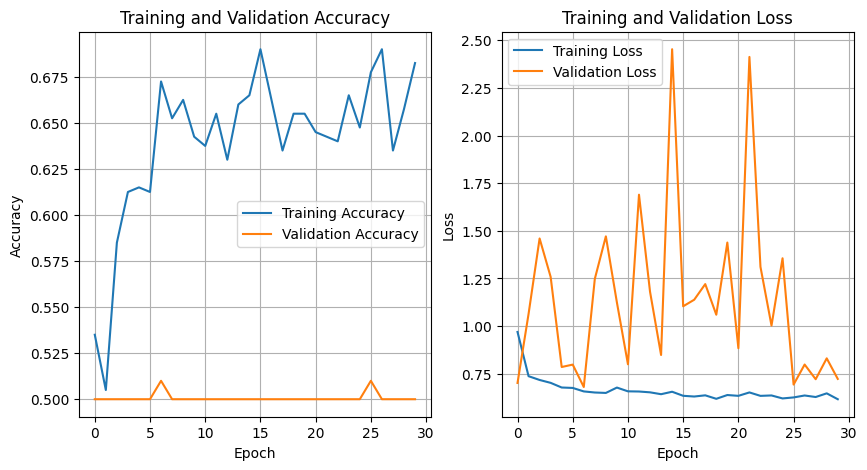

In [20]:
generate_plots(history_2_with_augmentation)

# Pre-Trained Model - Xception

In [82]:
####Pre-Trained Keras Model####
pre_trained = keras.applications.Xception(
    include_top=False,
    weights="imagenet",
    input_shape=(255, 255, 3)
)

In [83]:
for layer in pre_trained.layers:
    layer.trainable = False #freezing wieghts and biases

In [23]:
pre_trained.summary()

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 255, 255,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 127, 127,  │        864 │ input_layer_2[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 127, 127,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 127, 127,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 125, 125,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 125, 125,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 125, 125,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 125, 125,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 125, 125,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 125, 125,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 125, 125,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 125, 125,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 63, 63,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 63, 63,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 63, 63,    │        512 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 63, 63,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 63, 63,    │          0 │ add[0][0]       

 Total params: 20,861,480 (79.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,861,480 (79.58 MB)

In [24]:
pre_trained.layers[-1]

<Activation name=block14_sepconv2_act, built=True>

In [25]:
pre_trained.layers[-1].output

<KerasTensor shape=(None, 8, 8, 2048), dtype=float32, sparse=False, name=keras_tensor_283>

In [84]:
last_layer = pre_trained.get_layer('block14_sepconv2_act')
last_output = last_layer.output

In [85]:
x = layers.Dense(2048, activation='relu')(last_output)
x = layers.Dropout(.2)(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Flatten()(x)
x = layers.Dense(1, activation='sigmoid')(x)

model_pt = keras.Model(pre_trained.input, x) #appending dense network to base model

In [28]:
model_pt.summary()

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 255, 255,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 127, 127,  │        864 │ input_layer_2[0]… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_bn     │ (None, 127, 127,  │        128 │ block1_conv1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1_act    │ (None, 127, 127,  │          0 │ block1_conv1_bn[… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 125, 125,  │     18,432 │ block1_conv1_act… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_bn     │ (None, 125, 125,  │        256 │ block1_conv2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2_act    │ (None, 125, 125,  │          0 │ block1_conv2_bn[… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1     │ (None, 125, 125,  │      8,768 │ block1_conv2_act… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv1_bn  │ (None, 125, 125,  │        512 │ block2_sepconv1[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_act │ (None, 125, 125,  │          0 │ block2_sepconv1_… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2     │ (None, 125, 125,  │     17,536 │ block2_sepconv2_… │
│ (SeparableConv2D)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_sepconv2_bn  │ (None, 125, 125,  │        512 │ block2_sepconv2[… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 63, 63,    │      8,192 │ block1_conv2_act… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 63, 63,    │          0 │ block2_sepconv2_… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 63, 63,    │        512 │ conv2d_8[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 63, 63,    │          0 │ block2_pool[0][0… │
│                     │ 128)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_sepconv1_act │ (None, 63, 63,    │          0 │ add[0][0]       

 Total params: 25,059,881 (95.60 MB)

 Trainable params: 4,198,401 (16.02 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [86]:
model_pt.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])


model_checkpoint = ModelCheckpoint(
      filepath="pre_trained_with_data_augmentation.h5.keras",
      save_best_only=True,
      monitor="val_accuracy")

callbacks = [model_checkpoint]


history_pt = model_pt.fit(
    train_batches,
    epochs=30,
    validation_data=validation_batches,
    callbacks=callbacks)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 3/80 ━━━━━━━━━━━━━━━━━━━━ 6s 79ms/step - accuracy: 0.2000 - loss: 5.1901     

W0000 00:00:1723928709.279051    3867 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


79/80 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.5029 - loss: 1.5755

W0000 00:00:1723928720.725436    3867 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


80/80 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - accuracy: 0.5043 - loss: 1.5593 - val_accuracy: 0.6400 - val_loss: 0.6382
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.5998 - loss: 0.6683 - val_accuracy: 0.6100 - val_loss: 0.6525
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - accuracy: 0.6711 - loss: 0.6234 - val_accuracy: 0.6100 - val_loss: 0.6775
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 11s 128ms/step - accuracy: 0.6902 - loss: 0.6328 - val_accuracy: 0.6700 - val_loss: 0.6966
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.6553 - loss: 0.6518 - val_accuracy: 0.6900 - val_loss: 0.5945
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.6831 - loss: 0.6096 - val_accuracy: 0.6200 - val_loss: 0.6523
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - accuracy: 0.7161 - loss: 0.6154 - val_accuracy: 0.6400 - val_loss: 0.6434
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.7474 - loss: 0.5411 - val_accuracy: 0.610

## Xception - Plots

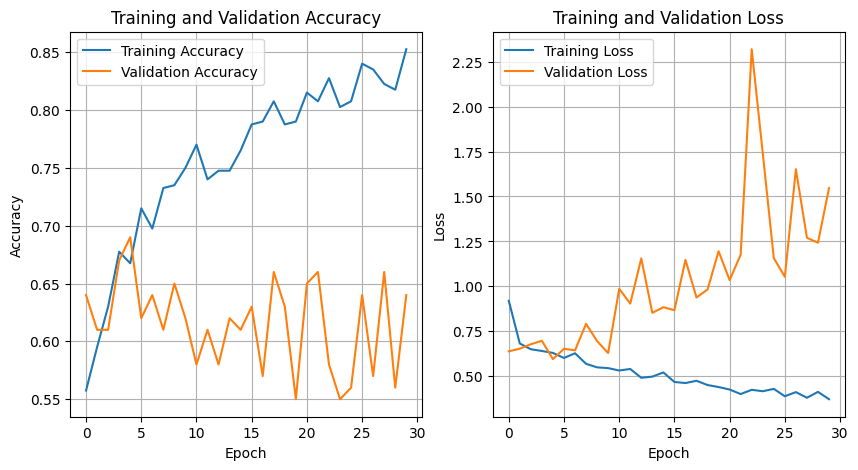

In [87]:
generate_plots(history_pt)

## Xception - Sample Batch Predictions

 7/20 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

W0000 00:00:1723922187.140855    3865 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step


/tmp/ipykernel_3778/1719383123.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f'Predicted: {class_names[int(pred_labels[label])]} // Actual: {class_names[label]}')


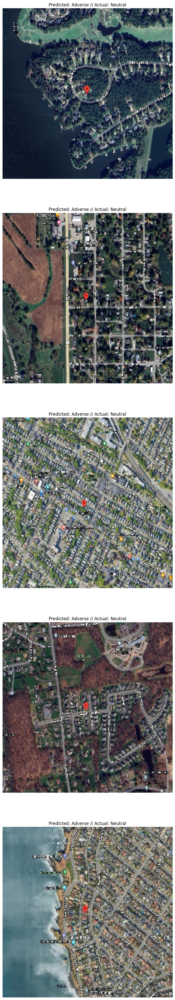

In [31]:
x, y = validation_batches[0]

preds = model_pt.predict(validation_batches)
pred_labels = np.where(preds < .5, 0, 1)

plt.figure(figsize=(10, 50))

for i in range(0,5):
    image = x[i]
    label = int(y[i])
    plt.subplot(5, 1, i+1)
    plt.imshow(image)
    plt.title(f'Predicted: {class_names[int(pred_labels[label])]} // Actual: {class_names[label]}')
    plt.axis('off')

plt.show()

# Pre-Trained Model - NASNetLarge

In [32]:
pre_trained_NAS = keras.applications.NASNetLarge(
    include_top=False,
    weights="imagenet",
    input_shape=(255, 255, 3)
)

In [34]:
for layer in pre_trained_NAS.layers:
    layer.trainable = False

In [35]:
pre_trained_NAS.summary()

Model: "nasnet_large"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 255, 255,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv1 (Conv2D) │ (None, 127, 127,  │      2,592 │ input_layer_3[0]… │
│                     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn1            │ (None, 127, 127,  │        384 │ stem_conv1[0][0]  │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 127, 127,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_conv_1_s… │ (None, 127, 127,  │      4,032 │ activation[0][0]  │
│ (Conv2D)            │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_bn_1_ste… │ (None, 127, 127,  │        168 │ reduction_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 127, 127,  │          0 │ reduction_bn_1_s… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 127, 127,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 131, 131,  │          0 │ activation_1[0][… │
│ (ZeroPadding2D)     │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 133, 133,  │          0 │ activation_3[0][… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 64, 64,    │      2,814 │ separable_conv_1… │
│ (SeparableConv2D)   │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 64, 64,    │      8,736 │ separable_conv_1… │
│ (SeparableConv2D)   │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 64, 64,    │        168 │ separable_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 64, 64,    │        168 │ separable_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ separable_conv_1… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 64, 64,    │          0 │ separable_conv_1… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_2_r… │ (None, 64, 64,    │      2,814 │ activation_2[0][

 Total params: 84,916,818 (323.93 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 84,916,818 (323.93 MB)

In [36]:
pre_trained_NAS.layers[-1]

<Activation name=activation_259, built=True>

In [37]:
pre_trained_NAS.layers[-1].output

<KerasTensor shape=(None, 8, 8, 4032), dtype=float32, sparse=False, name=keras_tensor_1327>

In [38]:
last_layer = pre_trained_NAS.get_layer('activation_259')
last_output = last_layer.output

In [39]:
x = layers.Dense(4032, activation='relu')(last_output)
x = layers.Dropout(.2)(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Flatten()(x)
x = layers.Dense(1, activation='sigmoid')(x)

model_NAS = keras.Model(pre_trained_NAS.input, x)

In [40]:
model_NAS.summary()

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 255, 255,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv1 (Conv2D) │ (None, 127, 127,  │      2,592 │ input_layer_3[0]… │
│                     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn1            │ (None, 127, 127,  │        384 │ stem_conv1[0][0]  │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 127, 127,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_conv_1_s… │ (None, 127, 127,  │      4,032 │ activation[0][0]  │
│ (Conv2D)            │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_bn_1_ste… │ (None, 127, 127,  │        168 │ reduction_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 127, 127,  │          0 │ reduction_bn_1_s… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 127, 127,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 131, 131,  │          0 │ activation_1[0][… │
│ (ZeroPadding2D)     │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 133, 133,  │          0 │ activation_3[0][… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 64, 64,    │      2,814 │ separable_conv_1… │
│ (SeparableConv2D)   │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 64, 64,    │      8,736 │ separable_conv_1… │
│ (SeparableConv2D)   │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 64, 64,    │        168 │ separable_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 64, 64,    │        168 │ separable_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ separable_conv_1… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 64, 64,    │          0 │ separable_conv_1… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_2_r… │ (None, 64, 64,    │      2,814 │ activation_2[0][

 Total params: 101,181,907 (385.98 MB)

 Trainable params: 16,265,089 (62.05 MB)

 Non-trainable params: 84,916,818 (323.93 MB)

In [41]:
model_NAS.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])


model_checkpoint = ModelCheckpoint(
      filepath="pre_trained_NAS_with_data_augmentation.h5.keras",
      save_best_only=True,
      monitor="val_accuracy")

callbacks = [model_checkpoint]


history_NAS = model_NAS.fit(
    train_batches,
    epochs=30,
    validation_data=validation_batches,
    callbacks=callbacks)

Epoch 1/30
 2/80 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.4500 - loss: 3.8369   

W0000 00:00:1723922449.544750    3865 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


80/80 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - accuracy: 0.5785 - loss: 1.8258

W0000 00:00:1723922477.500247    3864 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


80/80 ━━━━━━━━━━━━━━━━━━━━ 84s 427ms/step - accuracy: 0.5788 - loss: 1.8163 - val_accuracy: 0.6600 - val_loss: 0.6848
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - accuracy: 0.5542 - loss: 0.7269 - val_accuracy: 0.5800 - val_loss: 0.9467
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.6241 - loss: 0.6422 - val_accuracy: 0.6200 - val_loss: 0.6111
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.7075 - loss: 0.5963 - val_accuracy: 0.6100 - val_loss: 0.6498
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - accuracy: 0.6549 - loss: 0.6467 - val_accuracy: 0.6200 - val_loss: 0.9009
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.7185 - loss: 0.6120 - val_accuracy: 0.6000 - val_loss: 0.7132
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 137ms/step - accuracy: 0.6592 - loss: 0.6108 - val_accuracy: 0.6200 - val_loss: 0.8313
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 140ms/step - accuracy: 0.7266 - loss: 0.5893 - val_accuracy: 0.600

## NASNetLarge - Plots

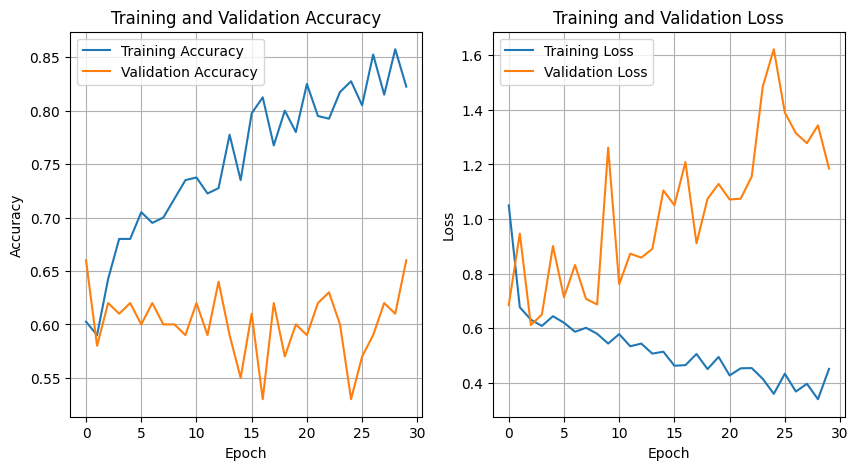

In [42]:
generate_plots(history_NAS)

## NASNetLarge - Sample Batch Predictions

 3/20 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step

W0000 00:00:1723923281.808691    3866 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


20/20 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step


/tmp/ipykernel_3778/1229623569.py:13: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(f'Predicted: {class_names[int(pred_labels[label])]} // Actual: {class_names[label]}')


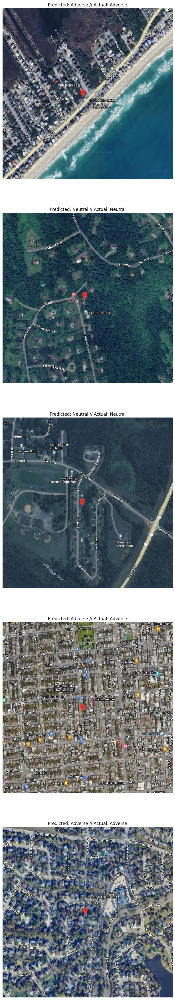

In [43]:
x, y = validation_batches[0]

preds = model_NAS.predict(validation_batches)
pred_labels = np.where(preds < .5, 0, 1)

plt.figure(figsize=(10, 50))

for i in range(0,5):
    image = x[i]
    label = int(y[i])
    plt.subplot(5, 1, i+1)
    plt.imshow(image)
    plt.title(f'Predicted: {class_names[int(pred_labels[label])]} // Actual: {class_names[label]}')
    plt.axis('off')

plt.show()

# Fine-Tuning Xception

In [88]:
# Loading weights and biases from the best Xception Model onto the base Xception model
pre_trained.load_weights("pre_trained_with_data_augmentation.h5.keras")

In [89]:
x = layers.Dense(2048, activation='relu')(last_output)
x = layers.Dropout(.2)(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Flatten()(x)
x = layers.Dense(1, activation='sigmoid')(x)

enhanced_X = keras.Model(pre_trained.input, x) #appending dense network to base model

In [90]:
# freeze all convolutional Xception layers
for layer in pre_trained.layers:
    layer.trainable = False

In [91]:
# Training the model for a few more epochs, but it's already pre-loaded witch good weigths from our "best" model
enhanced_X.compile(optimizer='rmsprop', 
                   loss='binary_crossentropy',
                  metrics=["accuracy"])

history_X_enhanced = enhanced_X.fit(
    train_batches,
    epochs=10,
    validation_data=validation_batches,
    callbacks=callbacks)

Epoch 1/10
 3/80 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - accuracy: 0.4444 - loss: 1.9714  

W0000 00:00:1723929117.589197    3867 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


79/80 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.6222 - loss: 1.1213

W0000 00:00:1723929128.894453    3864 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


80/80 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - accuracy: 0.6225 - loss: 1.1134 - val_accuracy: 0.6500 - val_loss: 0.7022
Epoch 2/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.6594 - loss: 0.6666 - val_accuracy: 0.6400 - val_loss: 0.6267
Epoch 3/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - accuracy: 0.6778 - loss: 0.6116 - val_accuracy: 0.6200 - val_loss: 0.6457
Epoch 4/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - accuracy: 0.6492 - loss: 0.6150 - val_accuracy: 0.6400 - val_loss: 0.7075
Epoch 5/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 114ms/step - accuracy: 0.6702 - loss: 0.6158 - val_accuracy: 0.6200 - val_loss: 0.6299
Epoch 6/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 115ms/step - accuracy: 0.7401 - loss: 0.5544 - val_accuracy: 0.6300 - val_loss: 0.6590
Epoch 7/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - accuracy: 0.7066 - loss: 0.5834 - val_accuracy: 0.6200 - val_loss: 0.7156
Epoch 8/10
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.7283 - loss: 0.5636 - val_accuracy: 0.600

In [65]:
# At this point, the top layers are well trained and we can start fine-tuning convolutional layers
# Freeze the bottom N layers and train the remaining top layers.

# Visualizing layer names and layer indices to see how many layers we should freeze:
for i, layer in enumerate(pre_trained.layers):
   print(i, layer.name)

0 input_layer_2
1 block1_conv1
2 block1_conv1_bn
3 block1_conv1_act
4 block1_conv2
5 block1_conv2_bn
6 block1_conv2_act
7 block2_sepconv1
8 block2_sepconv1_bn
9 block2_sepconv2_act
10 block2_sepconv2
11 block2_sepconv2_bn
12 conv2d_8
13 block2_pool
14 batch_normalization
15 add
16 block3_sepconv1_act
17 block3_sepconv1
18 block3_sepconv1_bn
19 block3_sepconv2_act
20 block3_sepconv2
21 block3_sepconv2_bn
22 conv2d_9
23 block3_pool
24 batch_normalization_1
25 add_1
26 block4_sepconv1_act
27 block4_sepconv1
28 block4_sepconv1_bn
29 block4_sepconv2_act
30 block4_sepconv2
31 block4_sepconv2_bn
32 conv2d_10
33 block4_pool
34 batch_normalization_2
35 add_2
36 block5_sepconv1_act
37 block5_sepconv1
38 block5_sepconv1_bn
39 block5_sepconv2_act
40 block5_sepconv2
41 block5_sepconv2_bn
42 block5_sepconv3_act
43 block5_sepconv3
44 block5_sepconv3_bn
45 add_3
46 block6_sepconv1_act
47 block6_sepconv1
48 block6_sepconv1_bn
49 block6_sepconv2_act
50 block6_sepconv2
51 block6_sepconv2_bn
52 block6_sep

In [92]:
# Training the top 2 inception blocks, i.e. Freezing the first 116 layers and unfreezing the rest:
for layer in pre_trained.layers[:116]:
   layer.trainable = False
for layer in pre_trained.layers[116:]:
   layer.trainable = True

In [93]:
# Recompiling the model for modifications to take effect
# Using a lower learning rate and momentum
enhanced_X.compile(optimizer=RMSprop(learning_rate=.0001, momentum=.9), 
                   loss='binary_crossentropy',
                  metrics=["accuracy"])

# Trainingthe model again (this time fine-tuning the top 2 inception blocks alongside the top Dense layers)
model_checkpoint = ModelCheckpoint(
      filepath="enhanced_Xception.h5.keras",
      save_best_only=True,
      monitor="val_accuracy")

callbacks = [model_checkpoint]

history_X_enhanced = enhanced_X.fit(
    train_batches,
    epochs=30,
    validation_data=validation_batches,
    callbacks=callbacks)

Epoch 1/30
 2/80 ━━━━━━━━━━━━━━━━━━━━ 4s 55ms/step - accuracy: 0.5000 - loss: 0.7217  

W0000 00:00:1723929256.014705    3866 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


79/80 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - accuracy: 0.5690 - loss: 0.7057

W0000 00:00:1723929267.299168    3867 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


80/80 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - accuracy: 0.5690 - loss: 0.7055 - val_accuracy: 0.5900 - val_loss: 1.9814
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 12s 136ms/step - accuracy: 0.6798 - loss: 0.6061 - val_accuracy: 0.6600 - val_loss: 1.6953
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 117ms/step - accuracy: 0.6264 - loss: 0.6644 - val_accuracy: 0.6500 - val_loss: 1.1377
Epoch 4/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 116ms/step - accuracy: 0.7337 - loss: 0.5664 - val_accuracy: 0.6100 - val_loss: 1.0902
Epoch 5/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - accuracy: 0.7642 - loss: 0.5545 - val_accuracy: 0.5800 - val_loss: 3.2551
Epoch 6/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - accuracy: 0.7456 - loss: 0.5307 - val_accuracy: 0.6100 - val_loss: 2.9946
Epoch 7/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 11s 133ms/step - accuracy: 0.7799 - loss: 0.5243 - val_accuracy: 0.7400 - val_loss: 1.4654
Epoch 8/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 10s 119ms/step - accuracy: 0.7711 - loss: 0.5401 - val_accuracy: 0.670

## Fine-Tuned Xception - Plots

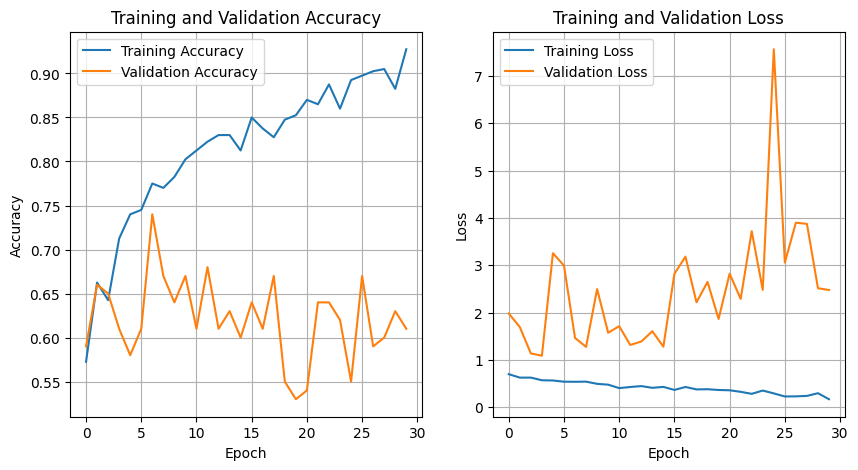

In [94]:
generate_plots(history_X_enhanced)